# Set-Up: Mount GDrive, Clone GitHub, Import Packages

In [ ]:
#Mount to gdrive to access data
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
#Change directory into project folder
%cd /content/drive/MyDrive/saliency_map_predictions

/content/drive/MyDrive/saliency_map_predictions


In [ ]:
#Clone the TranSalNet repo 
!git clone https://github.com/LJOVO/TranSalNet.git

fatal: destination path 'TranSalNet' already exists and is not an empty directory.


In [ ]:
#Import packages
import os
import sys
import time
import copy
import torch 
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, models
from torchsummary import summary
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from tqdm import tqdm
import csv
import cv2
from PIL import Image
import numpy as np
import os
import torch
from torch.utils.data import Dataset, DataLoader

In [ ]:
#Import loss function
py_file_location = "/content/drive/MyDrive/saliency_map_predictions/TranSalNet/utils/"
sys.path.append(os.path.abspath(py_file_location))
from loss_function import SaliencyLoss

In [ ]:
#Import the TranSalNet with ResNet-50 or DenseNet-161 backbone
flag = 1 #0 for TranSalNet_Dense, 1 for TranSalNet_Res

py_file_location = "/content/drive/MyDrive/saliency_map_predictions/TranSalNet/"
sys.path.append(os.path.abspath(py_file_location))

if flag:
    from TranSalNet_Res import TranSalNet
else:
    from TranSalNet_Dense import TranSalNet

#Model Version 10

The dataset here consists of patient 1-16, excluding patient 2 and patient 4. 100 epochs. Plotting training and validation loss. Using author-defined saliency loss function. Using data augmentation. Both saliency and fixations are binary mask images. 

In [ ]:
!pip install split-folders
import splitfolders

#Split original and mask images into training, validation, testing set
#We use a 0.8/0.1/0.1 train/val/test ratio
splitfolders.ratio("/content/drive/MyDrive/saliency_map_predictions/datasets/full_data_resized_w_noncontrol_cln_no7/", output="/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/", seed=1337, ratio=(0.8, 0.1, 0.1))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 864 files [00:17, 49.39 files/s] 


In [ ]:
# Generate the train_ids.csv file

#Set the paths to the directories containing the resized images that have been split
resized_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/stimuli/"
binarized_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/saliency/"
heatmap_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/saliency/"

#Get the list of filenames in each directory
resized_images_list = os.listdir(resized_images_path)
binarized_images_list = os.listdir(binarized_images_path)
heatmap_images_list = os.listdir(heatmap_images_path)

#Create a list of tuples containing the filenames from each directory
image_data = [(f, f.replace('_original.png', '_binary_mask_cln.png'), f.replace('_original.png', '_binary_mask_cln.png')) for f in resized_images_list]

#Specify the full path to the CSV file
csv_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train_ids.csv"

#Create the .csv file and write the data to it
with open(csv_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image', 'map', 'fixation'])
    for data in image_data:
        writer.writerow(data)

In [ ]:
#Generate the val_ids.csv file

#Set the paths to the directories containing the resized images that have been split
resized_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/stimuli/"
binarized_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/saliency/"
heatmap_images_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/saliency/"

#Get the list of filenames in each directory
resized_images_list = os.listdir(resized_images_path)
binarized_images_list = os.listdir(binarized_images_path)
heatmap_images_list = os.listdir(heatmap_images_path)

#Create a list of tuples containing the filenames from each directory
image_data = [(f, f.replace('_original.png', '_binary_mask_cln.png'), f.replace('_original.png', '_binary_mask_cln.png')) for f in resized_images_list]

#Specify the full path to the CSV file
csv_path = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val_ids.csv"

#Create the .csv file and write the data to it
with open(csv_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['image', 'map', 'fixation'])
    for data in image_data:
        writer.writerow(data)

In [ ]:
#Import the dataset
train_ids = pd.read_csv(r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train_ids.csv")
val_ids = pd.read_csv(r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val_ids.csv")

print(train_ids.iloc[1])
print(val_ids.iloc[1])

dataset_sizes = {'train':len(train_ids),'val':len(val_ids)}
print(dataset_sizes)

image              eem013_095_OS_original.png
map         eem013_095_OS_binary_mask_cln.png
fixation    eem013_095_OS_binary_mask_cln.png
Name: 1, dtype: object
image              eem013_036_OS_original.png
map         eem013_036_OS_binary_mask_cln.png
fixation    eem013_036_OS_binary_mask_cln.png
Name: 1, dtype: object
{'train': 172, 'val': 21}


In [ ]:
class MyDataset(Dataset):
    """Load dataset."""

    def __init__(self, ids, stimuli_dir, saliency_dir, fixation_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.ids = ids
        self.stimuli_dir = stimuli_dir
        self.saliency_dir = saliency_dir
        self.fixation_dir = fixation_dir
        self.transform = transform

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        im_path = self.stimuli_dir + self.ids.iloc[idx, 0]
        image = Image.open(im_path).convert('RGB')
        img = np.array(image) / 255.
        img = np.transpose(img, (2, 0, 1))
        img = torch.from_numpy(img)
        print(img.size())
        # if self.transform:
        #    img = self.transform(image)

        smap_path = self.saliency_dir + self.ids.iloc[idx, 1]
        saliency = Image.open(smap_path)

        smap = np.expand_dims(np.array(saliency) / 255., axis=0)
        smap = torch.from_numpy(smap)
        smap = smap.squeeze(0).permute(2, 0, 1)
        print(smap.size())

        fmap_path = self.fixation_dir + self.ids.iloc[idx, 2]
        fixation = Image.open(fmap_path)

        fmap = np.expand_dims(np.array(fixation) / 255., axis=0)
        fmap = torch.from_numpy(fmap)
        fmap = fmap.squeeze(0).permute(2, 0, 1)
        print(fmap.size())

        sample = {'image': img, 'saliency': smap, 'fixation': fmap}

        return sample

In [ ]:
#Load the data
from torchvision import transforms

# define the data augmentation transformations
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# define the non-augmented validation transform
val_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

batch_size = 1

train_set = MyDataset(ids=train_ids,
                           stimuli_dir=r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/stimuli/",
                           saliency_dir=r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/saliency/",
                           fixation_dir=r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/train/saliency/",
                          )

val_set = MyDataset(ids=val_ids,
                        stimuli_dir=r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/stimuli/",
                        saliency_dir = r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/saliency/",
                        fixation_dir=r"/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/val/saliency/",
                        )

dataloaders = {'train':DataLoader(train_set, batch_size=batch_size,shuffle=True, num_workers=0)
               ,'val':DataLoader(val_set, batch_size=batch_size,shuffle=False, num_workers=0)}

In [ ]:
print(len(train_set))  # print the total number of samples in the training set, including augmented samples

172


In [ ]:
#Verify the size of the original images, saliency maps, and fixation maps
sample = train_set[0]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


In [ ]:
#Ensure that you're in the project folder
%cd /content/drive/MyDrive/saliency_map_predictions/TranSalNet

/content/drive/MyDrive/saliency_map_predictions/TranSalNet


In [ ]:
#Load the model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = TranSalNet()
model = model.to(device)

In [ ]:
#Set the following parameters for training
optimizer = optim.Adam(model.parameters(),lr=1e-5)
scheduler = lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
loss_fn = SaliencyLoss()

'''Training'''
best_model_wts = copy.deepcopy(model.state_dict())
num_epochs = 100
best_loss = 100
for k,v in model.named_parameters():
    print('{}: {}'.format(k, v.requires_grad))

encoder.encoder.0.weight: True
encoder.encoder.1.weight: True
encoder.encoder.1.bias: True
encoder.encoder.4.0.conv1.weight: True
encoder.encoder.4.0.bn1.weight: True
encoder.encoder.4.0.bn1.bias: True
encoder.encoder.4.0.conv2.weight: True
encoder.encoder.4.0.bn2.weight: True
encoder.encoder.4.0.bn2.bias: True
encoder.encoder.4.0.conv3.weight: True
encoder.encoder.4.0.bn3.weight: True
encoder.encoder.4.0.bn3.bias: True
encoder.encoder.4.0.downsample.0.weight: True
encoder.encoder.4.0.downsample.1.weight: True
encoder.encoder.4.0.downsample.1.bias: True
encoder.encoder.4.1.conv1.weight: True
encoder.encoder.4.1.bn1.weight: True
encoder.encoder.4.1.bn1.bias: True
encoder.encoder.4.1.conv2.weight: True
encoder.encoder.4.1.bn2.weight: True
encoder.encoder.4.1.bn2.bias: True
encoder.encoder.4.1.conv3.weight: True
encoder.encoder.4.1.bn3.weight: True
encoder.encoder.4.1.bn3.bias: True
encoder.encoder.4.2.conv1.weight: True
encoder.encoder.4.2.bn1.weight: True
encoder.encoder.4.2.bn1.bias: T

Epoch 1/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:07,  3.23s/it]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:08,  1.14s/it]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:08,  1.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:08,  3.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:08,  4.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:08,  6.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:09,  7.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:09,  8.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:09,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:09,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:10,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:11,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:11,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:11,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:12,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:13,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:13,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:13,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:13,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:13,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:14,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:14,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:14,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:14,  9.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:14,  9.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:15,  9.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:15,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:15,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:15,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:16,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:16,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:16,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:18,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:18,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:19,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:19,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:19,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:19,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:19,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:20,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:20,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:20,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:20,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:21,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:21,  9.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:21,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:21,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:21,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:22,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:22,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:22,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:22,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:22,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:23,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:23,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:23,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:23,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:23,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:24,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:24,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:24,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:24,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:25,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:25,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:25,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:25,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:25,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:26,  6.58it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
train Loss: 26.1664


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 26.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 26.20it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 26.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 26.08it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 22.4108
Epoch 2/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.55it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.50it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.46it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:08,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:09,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:10,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:12,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:14,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:16,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.27it/s]


train Loss: 23.0810


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.93it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.95it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 26.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 25.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.80it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.83it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.8250
Epoch 3/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


25it [00:02,  9.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


27it [00:02,  9.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


29it [00:03,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


31it [00:03,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


33it [00:03,  9.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


35it [00:03,  9.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


37it [00:04,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


39it [00:04,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


41it [00:04,  9.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


43it [00:04,  9.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


45it [00:04,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


47it [00:05,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


49it [00:05,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


51it [00:05,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


53it [00:05,  9.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


55it [00:05,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


57it [00:06,  9.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


59it [00:06,  9.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


63it [00:06,  9.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


65it [00:07,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


67it [00:07,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


69it [00:07,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


71it [00:07,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


73it [00:07,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


75it [00:08,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


77it [00:08,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


79it [00:08,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


81it [00:08,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


83it [00:09,  9.11it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


85it [00:09,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


87it [00:09,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


89it [00:09,  9.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


91it [00:09,  9.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:09,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


93it [00:10,  9.34it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


95it [00:10,  9.37it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


97it [00:10,  9.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


99it [00:10,  9.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


101it [00:10,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


103it [00:11,  9.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


105it [00:11,  9.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


107it [00:11,  9.39it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


109it [00:11,  9.43it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


111it [00:12,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


113it [00:12,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


115it [00:12,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


117it [00:12,  9.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


119it [00:12,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


121it [00:13,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


123it [00:13,  9.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


125it [00:13,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


127it [00:13,  9.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


129it [00:13,  9.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


131it [00:14,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


133it [00:14,  9.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


135it [00:14,  9.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


137it [00:14,  9.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


139it [00:15,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


141it [00:15,  8.84it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.23it/s]


train Loss: 21.0866


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.36it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.46it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.78it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.50it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.8374
Epoch 4/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:16,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:17,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.27it/s]


train Loss: 19.5923


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 26.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 26.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 26.56it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 26.07it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 26.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.68it/s]


val Loss: 22.3352
Epoch 5/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.12it/s]


train Loss: 18.4213


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 22.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 22.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.81it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.74it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.6664
Epoch 6/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:13,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:17,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.23it/s]


train Loss: 16.9558


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.40it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.13it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.66it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.92it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.74it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.3985
Epoch 7/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:04,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:06,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:08,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:09,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:11,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.26it/s]


train Loss: 15.5114


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.78it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 26.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.83it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.7503
Epoch 8/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:04,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:16,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.20it/s]


train Loss: 14.3668


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 26.34it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.46it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 26.31it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 26.04it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.9445
Epoch 9/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:10,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:15,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.21it/s]


train Loss: 12.9968


3it [00:00, 25.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.97it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.25it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.32it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 22.1383
Epoch 10/100
----------


1it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.13it/s]


train Loss: 11.5272


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 22.56it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.65it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.77it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.28it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.4505
Epoch 11/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  8.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  8.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


25it [00:02,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


27it [00:02,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


29it [00:03,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


31it [00:03,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


33it [00:03,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


35it [00:03,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


37it [00:04,  9.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


39it [00:04,  9.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


41it [00:04,  9.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


43it [00:04,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


45it [00:04,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


47it [00:05,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


49it [00:05,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


51it [00:05,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


53it [00:05,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


55it [00:05,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


57it [00:06,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


59it [00:06,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


61it [00:06,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


63it [00:06,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


65it [00:07,  9.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


67it [00:07,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


69it [00:07,  9.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


71it [00:07,  9.11it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


73it [00:07,  9.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


75it [00:08,  9.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


77it [00:08,  9.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


79it [00:08,  9.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


81it [00:08,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


83it [00:09,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


85it [00:09,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


87it [00:09,  8.95it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


89it [00:09,  9.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


91it [00:09,  9.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


93it [00:10,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


95it [00:10,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


97it [00:10,  8.88it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


99it [00:10,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


101it [00:11,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


103it [00:11,  8.93it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


105it [00:11,  8.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


107it [00:11,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


109it [00:11,  9.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


111it [00:12,  9.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


113it [00:12,  9.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


115it [00:12,  8.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


117it [00:12,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


119it [00:13,  8.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


121it [00:13,  9.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


123it [00:13,  9.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


125it [00:13,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


127it [00:13,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


129it [00:14,  9.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


131it [00:14,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


133it [00:14,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


135it [00:14,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


137it [00:14,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


139it [00:15,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


141it [00:15,  9.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


143it [00:15,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


145it [00:15,  9.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


147it [00:16,  9.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


149it [00:16,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


151it [00:16,  8.88it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


153it [00:16,  8.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


155it [00:16,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


157it [00:17,  9.12it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


159it [00:17,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


161it [00:17,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


163it [00:17,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


165it [00:18,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


167it [00:18,  9.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


169it [00:18,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


171it [00:18,  9.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.15it/s]


train Loss: 10.2954


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.75it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 22.3241
Epoch 12/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.17it/s]


train Loss: 9.4871


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 25.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.60it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.57it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.51it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.0990
Epoch 13/100
----------



0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.44it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.16it/s]


train Loss: 8.4510


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.73it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.14it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.24it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 21.8429
Epoch 14/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.16it/s]


train Loss: 6.8838


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.56it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.65it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.66it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 22.2052
Epoch 15/100
----------



0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.08it/s]


train Loss: 5.8581


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 24.15it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.54it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.79it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.95it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 23.1325
Epoch 16/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  7.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.08it/s]


train Loss: 4.7867


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 23.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.58it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.47it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 22.8074
Epoch 17/100
----------



0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.14it/s]


train Loss: 4.1794


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.66it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.14it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.47it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.39it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.42it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.41it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.24it/s]


val Loss: 22.6463
Epoch 18/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.16it/s]


train Loss: 3.1986


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.41it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.21it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.13it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


val Loss: 23.1850
Epoch 19/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:08,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.13it/s]


train Loss: 2.1666


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 24.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.53it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.83it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 23.6807
Epoch 20/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.02it/s]


train Loss: 1.3245


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.90it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.59it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.78it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.51it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.59it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 23.4762
Epoch 21/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.04it/s]


train Loss: 0.6033


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 22.55it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.42it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.79it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.32it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 24.2464
Epoch 22/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  7.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  7.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  7.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  7.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  7.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.93it/s]


train Loss: -0.3492


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.93it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.82it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 24.6614
Epoch 23/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.04it/s]


train Loss: -1.1823


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.49it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.54it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.54it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.90it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


val Loss: 24.4322
Epoch 24/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.99it/s]


train Loss: -1.8722


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.06it/s]


val Loss: 25.1479
Epoch 25/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.91it/s]


train Loss: -2.5360


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.98it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 23.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.74it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 24.9349
Epoch 26/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -3.2526


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 22.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 21.79it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 23.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.68it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.73it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 26.5665
Epoch 27/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.88it/s]


train Loss: -3.6930


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.60it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.52it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 25.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.48it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 26.0105
Epoch 28/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.94it/s]


train Loss: -4.1781


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.59it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.40it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.80it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.60it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.57it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 27.2042
Epoch 29/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.96it/s]


train Loss: -4.6169


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 23.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 25.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.75it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 27.9276
Epoch 30/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.42it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.83it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.65it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.03it/s]


train Loss: -5.0779


3it [00:00, 25.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.19it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.20it/s]


val Loss: 27.6742
Epoch 31/100
----------


1it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.09it/s]


train Loss: -5.5809


3it [00:00, 23.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.47it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.12it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 28.1141
Epoch 32/100
----------



1it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.09it/s]


train Loss: -5.5201


3it [00:00, 22.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.08it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.82it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 29.1310
Epoch 33/100
----------


1it [00:00,  9.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.07it/s]


train Loss: -5.8919


3it [00:00, 25.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.65it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 28.8372
Epoch 34/100
----------


1it [00:00,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:07,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:16,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.14it/s]


train Loss: -6.4975


3it [00:00, 22.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.34it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.26it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.97it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 30.0050
Epoch 35/100
----------


1it [00:00,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.93it/s]


train Loss: -5.9813


3it [00:00, 24.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 29.5723
Epoch 36/100
----------



1it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:18,  9.07it/s]


train Loss: -5.7527


3it [00:00, 23.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 23.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.37it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.32it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 31.2546
Epoch 37/100
----------


1it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -7.1857


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.30it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.89it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 30.7860
Epoch 38/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -7.9249


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.20it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.42it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.64it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.94it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 31.7800
Epoch 39/100
----------


1it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -8.3238


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.66it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.67it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.63it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 30.5785
Epoch 40/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.87it/s]


train Loss: -8.7145


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 23.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.53it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])

18it [00:00, 24.53it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.29it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 31.7043
Epoch 41/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.43it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.78it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.01it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  9.04it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  9.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


25it [00:02,  8.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.72it/s]

torch.Size([3, 288, 384])


27it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.91it/s]


train Loss: -6.8562


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.06it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.95it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.33it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 32.0860
Epoch 42/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.71it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.71it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  9.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  9.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


25it [00:02,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


27it [00:02,  9.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


29it [00:03,  8.77it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.96it/s]


train Loss: -7.7180


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.88it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.08it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 32.4814
Epoch 43/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.96it/s]


train Loss: -8.6954


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.89it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.47it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.45it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.14it/s]


val Loss: 33.3742
Epoch 44/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.91it/s]


train Loss: -8.9492


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 22.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.43it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.47it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.21it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.01it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.92it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 33.4840
Epoch 45/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.41it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.93it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  8.93it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  8.98it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  8.83it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  8.90it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  8.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -6.9277


3it [00:00, 25.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 23.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.04it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 32.6567
Epoch 46/100
----------


1it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.84it/s]


train Loss: -7.5104


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.49it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.93it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.11it/s]


val Loss: 32.9682
Epoch 47/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -9.0287


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 24.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.87it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.24it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.61it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 23.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.13it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 33.5994
Epoch 48/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.89it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.64it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -9.6782


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.04it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.75it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.16it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.66it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 33.6104
Epoch 49/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.11it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.88it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  8.69it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.84it/s]


train Loss: -8.0922


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.85it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 33.6801
Epoch 50/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:09,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.84it/s]


train Loss: -9.8907


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.16it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.28it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.23it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.17it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


val Loss: 35.1369
Epoch 51/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.85it/s]


train Loss: -10.4641


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.63it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.49it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.64it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.89it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.27it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 32.9411
Epoch 52/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.94it/s]


train Loss: -9.0341


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.26it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 23.99it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.34it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 34.5239
Epoch 53/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.02it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  8.74it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -9.7454


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.51it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.35it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: 

21it [00:00, 24.94it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 35.8193
Epoch 54/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.87it/s]


train Loss: -9.6117


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 23.49it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.58it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.45it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 23.89it/s]


gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 33.7663
Epoch 55/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.42it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.83it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.58it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:09,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.80it/s]


train Loss: -9.8926


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 23.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.10it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 35.3585
Epoch 56/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.85it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.04it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.91it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  8.95it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  8.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.01it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  9.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  8.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  8.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  8.62it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.96it/s]


train Loss: -9.7717


3it [00:00, 25.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.50it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 35.9327
Epoch 57/100
----------



1it [00:00,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.97it/s]


train Loss: -10.5019


3it [00:00, 24.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.97it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.94it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.87it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 34.9643
Epoch 58/100
----------


1it [00:00,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.93it/s]


train Loss: -10.8431


3it [00:00, 25.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.01it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.97it/s]


val Loss: 36.6717
Epoch 59/100
----------


1it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.85it/s]


train Loss: -10.2467


3it [00:00, 25.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 26.19it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.40it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.93it/s]


val Loss: 36.4437
Epoch 60/100
----------


1it [00:00,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.82it/s]


train Loss: -10.7927


3it [00:00, 25.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.06it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])

21it [00:00, 24.44it/s]



gt_map size: torch.Size([3, 288, 384])
val Loss: 37.3812
Epoch 61/100
----------


1it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.00it/s]


train Loss: -10.0264


3it [00:00, 26.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.79it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.97it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 37.0290
Epoch 62/100
----------


1it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.87it/s]


train Loss: -11.1291


3it [00:00, 26.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.64it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.88it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 37.8576
Epoch 63/100
----------


1it [00:00,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.90it/s]


train Loss: -10.9951


3it [00:00, 24.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.99it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.19it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 37.0761
Epoch 64/100
----------


1it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.83it/s]


train Loss: -10.4101


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 22.53it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 21.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 22.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.40it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.54it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.23it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 38.3186
Epoch 65/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:10,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.83it/s]


train Loss: -10.2332


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 26.34it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.84it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.30it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.04it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.50it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.82it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 39.6286
Epoch 66/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.88it/s]


train Loss: -10.8029


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.72it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.53it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.77it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.86it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 39.3979
Epoch 67/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  7.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.71it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.96it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.84it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.54it/s]

torch.Size([3, 288, 384])


9it [00:01,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.86it/s]


train Loss: -11.5267


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.24it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.60it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.34it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.49it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.95it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 39.0164
Epoch 68/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -10.5489


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.48it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.74it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.58it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 25.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.31it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.00it/s]


val Loss: 39.7085
Epoch 69/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.81it/s]


train Loss: -12.1001


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.17it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.43it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.62it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.01it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.51it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 39.8790
Epoch 70/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  8.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:17,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:18,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:19,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.74it/s]


train Loss: -11.9266


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 23.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.74it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.41it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.54it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.54it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.3763
Epoch 71/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.85it/s]


train Loss: -10.9936


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.02it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.11it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.10it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.09it/s]


val Loss: 41.3393
Epoch 72/100
----------


1it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.97it/s]


train Loss: -12.0126


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.48it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.50it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.40it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.09it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.25it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 40.5883
Epoch 73/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.98it/s]


train Loss: -12.6540


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 23.83it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.58it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.7349
Epoch 74/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.33it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.95it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.98it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  8.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  8.89it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  8.71it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


17it [00:01,  8.79it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


19it [00:02,  9.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:02,  9.04it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


23it [00:02,  8.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


25it [00:02,  8.67it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


27it [00:03,  8.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


29it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.87it/s]


train Loss: -12.4254


3it [00:00, 24.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.79it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.58it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.24it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 40.4995
Epoch 75/100
----------


1it [00:00,  9.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.90it/s]


train Loss: -10.8961


3it [00:00, 25.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.71it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.55it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.0136
Epoch 76/100
----------



1it [00:00,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.91it/s]


train Loss: -11.9977


3it [00:00, 25.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.72it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.07it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.85it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.4305
Epoch 77/100
----------


1it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.93it/s]


train Loss: -12.8662


3it [00:00, 25.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.28it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.51it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.5077
Epoch 78/100
----------


1it [00:00,  7.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.84it/s]


train Loss: -12.6327


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.30it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.68it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.95it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])

21it [00:00, 25.01it/s]



gt_map size: torch.Size([3, 288, 384])
val Loss: 40.8329
Epoch 79/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  7.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:13,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:16,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:17,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:19,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.76it/s]


train Loss: -10.8346


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 23.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.72it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.94it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.62it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.67it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 40.8789
Epoch 80/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.87it/s]


train Loss: -12.8925


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.22it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.29it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.76it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 25.08it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.48it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.61it/s]


torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 41.8887
Epoch 81/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -13.2235


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.44it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.59it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.18it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.87it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.06it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.91it/s]


val Loss: 42.9123
Epoch 82/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:04,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:10,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.79it/s]


train Loss: -13.3906


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.99it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.95it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.45it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.54it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.04it/s]


val Loss: 42.7678
Epoch 83/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.88it/s]


train Loss: -13.3425


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 25.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.23it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.63it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 42.4064
Epoch 84/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.80it/s]


train Loss: -13.3904


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 25.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.40it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.34it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.47it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 42.5832
Epoch 85/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.54it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.91it/s]


train Loss: -13.2692


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:00, 24.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.47it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.94it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 43.2539
Epoch 86/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -13.3858


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.34it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.50it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.46it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.44it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.61it/s]


val Loss: 43.3278
Epoch 87/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.90it/s]


train Loss: -13.4559


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.43it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.25it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.26it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 42.8922
Epoch 88/100
----------



0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.89it/s]


train Loss: -13.5246


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.63it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.21it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.58it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.49it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 42.6007
Epoch 89/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:05,  8.38it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:12,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.48it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:14,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:16,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.82it/s]


train Loss: -13.5159


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 24.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 23.87it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 23.01it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.52it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 23.86it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 44.2225
Epoch 90/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.55it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.97it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  8.70it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  8.89it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:01,  8.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:15,  8.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.43it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.83it/s]


train Loss: -13.4608


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00, 24.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.13it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 25.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.78it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 46.9086
Epoch 91/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.93it/s]


train Loss: -13.1654


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00, 24.04it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.89it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.75it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.69it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 43.1825
Epoch 92/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  8.32it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.18it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.60it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.45it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.92it/s]


train Loss: -13.4853


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.60it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.96it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.89it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.28it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.74it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 44.2845
Epoch 93/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:11,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:12,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:15,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.61it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:16,  8.44it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:17,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.46it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:18,  8.37it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:19,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:19,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:19,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.85it/s]


train Loss: -13.6677


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.86it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.67it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.81it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.20it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.59it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.80it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.89it/s]


gt_map size: torch.Size([3, 288, 384])
val Loss: 46.4161
Epoch 94/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.52it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.32it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.00it/s]


train Loss: -13.8902


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 24.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 25.61it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.62it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 26.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.51it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: 

21it [00:00, 25.49it/s]


torch.Size([3, 288, 384])
val Loss: 46.2506
Epoch 95/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  8.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:06,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.54it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:09,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.99it/s]


train Loss: -13.6753


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 26.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 24.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.81it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.34it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.67it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 24.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.72it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 44.8719
Epoch 96/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.49it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.31it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.33it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.42it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.40it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.02it/s]


train Loss: -13.8541


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.54it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.73it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 24.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.10it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.34it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.41it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 46.6904
Epoch 97/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  7.82it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  8.70it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.47it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.66it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:01,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:02,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:04,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.39it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.30it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.70it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.62it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.57it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.41it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.73it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.03it/s]


train Loss: -13.9229


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.33it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.41it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 24.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 24.92it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 25.01it/s]


val Loss: 46.1724
Epoch 98/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


1it [00:00,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:05,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  8.65it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:08,  8.68it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  8.79it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  8.51it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:11,  8.69it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  8.50it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:12,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  8.72it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:13,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  9.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  8.71it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  8.77it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:15,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:16,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.56it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.55it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:17,  8.58it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:17,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:19,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  8.98it/s]


train Loss: -13.9604


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 25.86it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 25.08it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00, 25.55it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 25.77it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:00, 25.74it/s]

torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 25.46it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


21it [00:00, 25.24it/s]


gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 45.5564
Epoch 99/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.04it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


3it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


5it [00:00,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


7it [00:00,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


9it [00:00,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


11it [00:01,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


13it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:01,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


17it [00:01,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:01,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


20it [00:02,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


22it [00:02,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


24it [00:02,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


26it [00:02,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:02,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


28it [00:03,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


30it [00:03,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


32it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


34it [00:03,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


36it [00:03,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


38it [00:04,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


40it [00:04,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


42it [00:04,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


44it [00:04,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


46it [00:05,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


48it [00:05,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


50it [00:05,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


52it [00:05,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


54it [00:05,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


56it [00:06,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


58it [00:06,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


60it [00:06,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


62it [00:06,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


64it [00:07,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


66it [00:07,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


68it [00:07,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


70it [00:07,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


72it [00:07,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


74it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


76it [00:08,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


78it [00:08,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


80it [00:08,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


82it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


84it [00:09,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


86it [00:09,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


88it [00:09,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


90it [00:09,  9.36it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  9.26it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


92it [00:10,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


94it [00:10,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


96it [00:10,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


98it [00:10,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


100it [00:11,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


102it [00:11,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


104it [00:11,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


106it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


108it [00:11,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


110it [00:12,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


112it [00:12,  9.18it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


114it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


116it [00:12,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


118it [00:12,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


120it [00:13,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


122it [00:13,  8.83it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


124it [00:13,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


126it [00:13,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


128it [00:14,  9.16it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


130it [00:14,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


132it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


134it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:14,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


136it [00:14,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


138it [00:15,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


140it [00:15,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


142it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.13it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


144it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:15,  9.28it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


146it [00:16,  9.29it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


148it [00:16,  8.74it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


150it [00:16,  8.86it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


152it [00:16,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


154it [00:16,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


156it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


158it [00:17,  8.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


160it [00:17,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  8.89it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


162it [00:17,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


164it [00:18,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


166it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


168it [00:18,  8.59it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


170it [00:18,  8.82it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  8.87it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.04it/s]


train Loss: -13.9856


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00, 22.29it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


6it [00:00, 23.98it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 24.38it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.45it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


15it [00:00, 24.63it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


18it [00:00, 23.75it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 23.97it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 47.6630
Epoch 100/100
----------


0it [00:00, ?it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


1it [00:00,  9.22it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


2it [00:00,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


3it [00:00,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


4it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


5it [00:00,  9.16it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


6it [00:00,  9.22it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


7it [00:00,  9.15it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


8it [00:00,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00,  9.03it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


10it [00:01,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


11it [00:01,  9.00it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


12it [00:01,  8.93it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


13it [00:01,  9.05it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


14it [00:01,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


15it [00:01,  9.13it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


16it [00:01,  8.70it/s]

torch.Size([3, 288, 384])


17it [00:01,  8.67it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


19it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:02,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


23it [00:02,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


25it [00:02,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


27it [00:03,  9.08it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


29it [00:03,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


31it [00:03,  9.19it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


33it [00:03,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


35it [00:03,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


37it [00:04,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


39it [00:04,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


41it [00:04,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


43it [00:04,  8.75it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


45it [00:04,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


47it [00:05,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


49it [00:05,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


51it [00:05,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


53it [00:05,  9.23it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


55it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


57it [00:06,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


59it [00:06,  9.17it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


61it [00:06,  9.02it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


63it [00:06,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


65it [00:07,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


67it [00:07,  9.04it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


69it [00:07,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


71it [00:07,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


73it [00:08,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


75it [00:08,  8.90it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


77it [00:08,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


79it [00:08,  9.06it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


81it [00:08,  8.76it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


83it [00:09,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


85it [00:09,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


87it [00:09,  8.35it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


89it [00:09,  8.80it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


91it [00:10,  8.94it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


93it [00:10,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


95it [00:10,  9.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


97it [00:10,  9.03it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


99it [00:10,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


101it [00:11,  9.12it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


103it [00:11,  8.96it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


105it [00:11,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


107it [00:11,  9.00it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


109it [00:12,  8.97it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


111it [00:12,  8.88it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


113it [00:12,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


115it [00:12,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


117it [00:12,  8.92it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


119it [00:13,  8.81it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


121it [00:13,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


123it [00:13,  8.91it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


125it [00:13,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


127it [00:14,  8.64it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


129it [00:14,  8.53it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


131it [00:14,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


133it [00:14,  8.98it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


135it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


137it [00:15,  9.24it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


139it [00:15,  9.27it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


141it [00:15,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


143it [00:15,  9.09it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


145it [00:16,  8.85it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


147it [00:16,  8.99it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


149it [00:16,  9.14it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


151it [00:16,  9.20it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


153it [00:16,  9.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


155it [00:17,  8.95it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


157it [00:17,  8.84it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


159it [00:17,  8.78it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


161it [00:17,  9.01it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


163it [00:18,  9.05it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


165it [00:18,  9.11it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


167it [00:18,  9.15it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


169it [00:18,  9.10it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


171it [00:18,  9.07it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


172it [00:19,  9.01it/s]


train Loss: -13.9447


3it [00:00, 24.21it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


9it [00:00, 23.25it/s]

torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])


12it [00:00, 24.27it/s]

gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


18it [00:00, 24.71it/s]

gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])


21it [00:00, 24.29it/s]


torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
gt_map size: torch.Size([3, 288, 384])
val Loss: 48.0823


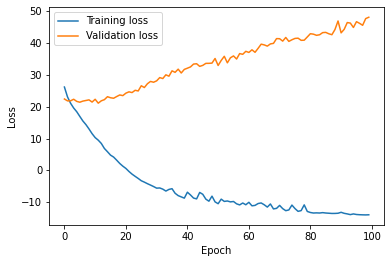

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store losses
train_losses = []
val_losses = []

# Train the model (Version 2)
for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch + 1, num_epochs))
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()  # Set model to training mode
        else:
            model.eval()   # Set model to evaluate mode

        running_loss = 0.0
        
        # Iterate over data.
        for i_batch, sample_batched in tqdm(enumerate(dataloaders[phase])):
            stimuli, smap, fmap = sample_batched['image'], sample_batched['saliency'], sample_batched['fixation']
            stimuli, smap, fmap = stimuli.type(torch.cuda.FloatTensor), smap.type(torch.cuda.FloatTensor), fmap.type(torch.cuda.FloatTensor)
            stimuli, smap, fmap = stimuli.to(device), smap.to(device), fmap.to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(stimuli)
                
                loss = -2*loss_fn(outputs,smap,loss_type='cc')\
                        -1*loss_fn(outputs,smap,loss_type='sim')+\
                        10*loss_fn(outputs,smap,loss_type='kldiv')-1*loss_fn(outputs,fmap,loss_type='nss')

                # backward + optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # statistics
            running_loss += loss.item() * stimuli.size(0)

        # Calculate average loss for the epoch
        epoch_loss = running_loss / len(dataloaders[phase].dataset)
        
        # Store the loss
        if phase == 'train':
            train_losses.append(epoch_loss)
        else:
            val_losses.append(epoch_loss)

        # Print the loss for the epoch
        print('{} Loss: {:.4f}'.format(phase, epoch_loss))

# Plot the loss curves
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
#Save the model
savepath = r'/content/drive/MyDrive/saliency_map_predictions/model_version_10.pth'
torch.save(model.state_dict(),savepath)

In [ ]:
import os
import torch
import cv2
import numpy as np
from torchvision import transforms, utils, models
import torch.nn as nn
from tqdm import tqdm
from PIL import Image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

flag = 1 #0 for TranSalNet_Dense, 1 for TranSalNet_Res

In [ ]:
#Load the post-processing functions
py_file_location = "/content/drive/MyDrive/saliency_map_predictions/TranSalNet/utils/"
sys.path.append(os.path.abspath(py_file_location))

from data_process import preprocess_img, postprocess_img

In [ ]:
#Load the saved model
if flag:
    from TranSalNet_Res import TranSalNet
    model = TranSalNet()
    model.load_state_dict(torch.load(r'/content/drive/MyDrive/saliency_map_predictions/model_version_10.pth'))
else:
    from TranSalNet_Dense import TranSalNet
    model = TranSalNet()
    model.load_state_dict(torch.load(r'pretrained_models\TranSalNet_Dense.pth'))

model = model.to(device) 
model.eval()

TranSalNet(
  (encoder): _Encoder(
    (encoder): ModuleList(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
      

In [ ]:
import os
import cv2

# Directory containing test images
test_dir = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_10/test/stimuli/"

# Loop through all images in directory
for img_file in os.listdir(test_dir):
    # Check if file is an image
    if img_file.endswith(".png") or img_file.endswith(".jpg"):
        # Get full path to image file
        img_path = os.path.join(test_dir, img_file)
        
        # Predict saliency map for image
        img = preprocess_img(img_path)
        img = np.array(img)/255.
        img = np.expand_dims(np.transpose(img,(2,0,1)),axis=0)
        img = torch.from_numpy(img)
        img = img.type(torch.cuda.FloatTensor).to(device)
        pred_saliency = model(img)
        toPIL = transforms.ToPILImage()
        pic = toPIL(pred_saliency.squeeze())
        pred_saliency = postprocess_img(pic, img_path)
        
        # Save predicted saliency map
        out_file = os.path.join(test_dir, img_file.replace(".", "_prediction."))
        cv2.imwrite(out_file, pred_saliency, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
        
print('Finished.')

Finished.


In [ ]:
import os
import numpy as np
from PIL import Image
from scipy.stats import pearsonr

In [ ]:
import cv2

def load_images_from_folder(folder_path, resize_shape=None):
    images = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            if resize_shape is not None:
                img = cv2.resize(img, resize_shape)
            images.append(img)
    return images

gt_folder = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_8/test/saliency/"
pred_folder = "/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_8/test/predictions/"

# resize_shape is a tuple with the desired shape of the resized images (height, width)
resize_shape = (500, 500)

gt_images = load_images_from_folder(gt_folder, resize_shape)
pred_images = load_images_from_folder(pred_folder, resize_shape)

for i in range(len(gt_images)):
    gt_image = gt_images[i]
    pred_image = pred_images[i]
    correlation, _ = pearsonr(gt_image.flatten(), pred_image.flatten())
    print("Correlation for image {}: {}".format(i+1, correlation))


Correlation for image 1: -0.005491925035968433
Correlation for image 2: 0.26283114911926153
Correlation for image 3: 0.15788520821995713
Correlation for image 4: 0.15393396348573568
Correlation for image 5: 0.056041906311256176
Correlation for image 6: 0.05484556055714749
Correlation for image 7: 0.1599127182599615
Correlation for image 8: 0.18705484846289314
Correlation for image 9: 0.15633782152376643
Correlation for image 10: 0.029332726140621178
Correlation for image 11: 0.00813509172862257
Correlation for image 12: 0.05123350740702848
Correlation for image 13: 0.10999081156446965
Correlation for image 14: 0.15129787821396876
Correlation for image 15: 0.18331369015982427
Correlation for image 16: 0.02712207844060205
Correlation for image 17: 0.09931670177670221
Correlation for image 18: 0.1275553533004944
Correlation for image 19: 0.11892238246532166
Correlation for image 20: 0.0855911225221126
Correlation for image 21: 0.026671320815078933


In [ ]:
def show_thresholded_pred(img): 

    # Create directory for thresholded images
    thresholded_path = os.path.join(os.path.dirname(img), 'thresholded_images')
    if not os.path.exists(thresholded_path):
        os.makedirs(thresholded_path)

    fig = plt.figure(figsize=(80, 40))
  
    # setting values to rows and column variables
    rows = 1
    columns = 2

    pred_im = cv2.imread(img)
    fig.add_subplot(rows, columns, 1)
    plt.imshow(pred_im)

    # Threshold image
    thresh = 20
    im_bw = cv2.threshold(pred_im, thresh, 255, cv2.THRESH_BINARY)[1]

    # Save thresholded image to new directory with suffix "_threshold"
    filename = os.path.splitext(os.path.basename(img))[0] + '_threshold.jpg'
    thresholded_pathname = os.path.join(thresholded_path, filename)
    cv2.imwrite(thresholded_pathname, im_bw)

    fig.add_subplot(rows, columns, 2)
    plt.imshow(im_bw)

    plt.show()

In [ ]:
for file in glob.glob("/content/drive/MyDrive/saliency_map_predictions/datasets/split_data_model_8/test/predictions/"+"/*.png"): 
    show_thresholded_pred(file)